# Grad CAM

In [1]:
import sys

sys.executable, sys.version

('/workspace/ViCLIP-OT/.venv/bin/python3',
 '3.12.12 (main, Jan 27 2026, 23:58:14) [Clang 21.1.4 ]')

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
%cd /workspace/ViCLIP-OT

/workspace/ViCLIP-OT


## Import libraries

In [4]:
import os
import textwrap
from dataclasses import dataclass

import cv2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import scienceplots  # noqa: F401
import torch
import torch.nn as nn
import torchvision.transforms.v2 as v2
from matplotlib.gridspec import GridSpec
from PIL import Image, ImageFile
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import preprocess_image, show_cam_on_image

import viclip_ot.constants as C
import viclip_ot.utils as utils
from viclip_ot.model import ViCLIPOT, ViCLIPOTConfig
from viclip_ot.utils.logger import logger

ImageFile.LOAD_TRUNCATED_IMAGES = True

/workspace/ViCLIP-OT/.venv/lib/python3.12/site-packages/timm/models/helpers.py:7: FutureWarning: Importing from timm.models.helpers is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


## Config

In [5]:
SEED = 42
DATASET_DIR = "./data/UIT-OpenViIC"
MODEL_CONFIG_FILE = "./config/model.vit_base_dinov3_sbert_siglip.yaml"
VICLIP__CHECKPOINT = "./checkpoints/siglip_sigrot.pth"
DEVICE = "auto"

## Loading model

In [6]:
utils.set_seed(SEED)
device = utils.get_device(DEVICE)
print(f"Using device: {device}")

Using device: cuda


In [7]:
model_config = ViCLIPOTConfig.model_validate(utils.load_yaml_file(MODEL_CONFIG_FILE))
visiglip_ot = ViCLIPOT(config=model_config).to(device).eval()
siglip = ViCLIPOT(config=model_config).to(device).eval()

In [8]:
visiglip_ot_checkpoint = torch.load(
    "./checkpoints/siglip_sigrot.pth", map_location=device, weights_only=False
)
visiglip_ot.load_state_dict(visiglip_ot_checkpoint["model_state_dict"], strict=True)

siglip_checkpoint = torch.load("./checkpoints/siglip.pth", map_location=device, weights_only=False)
siglip.load_state_dict(siglip_checkpoint["model_state_dict"], strict=True)

<All keys matched successfully>

In [9]:
eval_transforms = v2.Compose(
    [
        v2.Resize(size=256, interpolation=v2.InterpolationMode.BICUBIC),
        v2.CenterCrop(size=224),
        v2.ToTensor(),
        v2.Normalize(
            mean=C.IMAGENET_DEFAULT_MEAN,
            std=C.IMAGENET_DEFAULT_STD,
        ),
    ]
)


def process_image(image_path: str) -> Image.Image:
    try:
        image = Image.open(image_path)
        # # handle palette images with transparency
        # if image.mode == "P" and "transparency" in image.info:
        #     image = image.convert("RGBA")

        # image = image.convert("RGB")
        image = image.convert("L")

        image = eval_transforms(image)

        return image
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        raise e

/workspace/ViCLIP-OT/.venv/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [10]:
eigen_smooth = False
aug_smooth = True
NUM_REG_TOKENS = visiglip_ot.image_encoder.trunk.reg_token.shape[1] + 1

In [11]:
def reshape_transform(tensor):
    # tensor has shape (B, N, C) where N includes the CLS token.
    B, N, C = tensor.shape

    # Remove the CLS token.
    token_seq = tensor[:, NUM_REG_TOKENS:, :]
    # Compute the spatial size: assume square grid.
    spatial_dim = int((N - NUM_REG_TOKENS) ** 0.5)
    assert spatial_dim * spatial_dim == (N - NUM_REG_TOKENS), (
        "Number of tokens (excluding CLS) is not a perfect square"
    )
    result = token_seq.reshape(B, spatial_dim, spatial_dim, C)
    # Bring channels to first dimension: result shape (B, C, spatial_dim, spatial_dim)
    result = result.transpose(2, 3).transpose(1, 2)
    return result

In [12]:
class ImageClassifier(nn.Module):
    def __init__(self, viclip_ot: ViCLIPOT, labels: list[str]):
        super(ImageClassifier, self).__init__()
        self.viclip_ot = viclip_ot
        self.labels = labels

    def forward(self, x):
        text_inputs = self.viclip_ot.text_encoder.tokenizer(
            self.labels, return_tensors="pt", padding=True
        ).to(x.device)

        outputs = self.viclip_ot(images=x, text_inputs=text_inputs)

        image_features = outputs["image_features"]
        text_features = outputs["text_features"]
        logit_scale = outputs["logit_scale"]

        logits_per_image = image_features @ text_features.t() * logit_scale
        # logits_per_image = outputs.logits_per_image
        probs = logits_per_image.softmax(dim=1)

        for label, prob in zip(self.labels, probs[0], strict=True):
            print(f"{label}: {prob:.4f}")

        return probs

    def get_target_layers(self):
        return [self.viclip_ot.image_encoder.trunk.blocks[-1].norm1]  # pyright: ignore

Query: Một người đàn ông đang cầm trên tay những quả táo
Một người đàn ông đang cầm trên tay những quả táo: 0.9998
: 0.0002
Một người đàn ông đang cầm trên tay những quả táo: 0.9998
: 0.0002
Một người đàn ông đang cầm trên tay những quả táo: 0.9998
: 0.0002
Một người đàn ông đang cầm trên tay những quả táo: 0.9998
: 0.0002
Một người đàn ông đang cầm trên tay những quả táo: 0.9998
: 0.0002
Một người đàn ông đang cầm trên tay những quả táo: 0.9998
: 0.0002


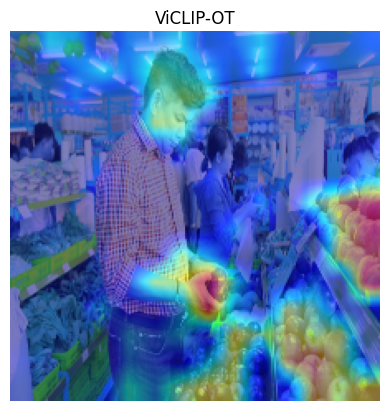

Một người đàn ông đang cầm trên tay những quả táo: 0.9991
: 0.0009
Một người đàn ông đang cầm trên tay những quả táo: 0.9991
: 0.0009
Một người đàn ông đang cầm trên tay những quả táo: 0.9991
: 0.0009
Một người đàn ông đang cầm trên tay những quả táo: 0.9990
: 0.0010
Một người đàn ông đang cầm trên tay những quả táo: 0.9990
: 0.0010
Một người đàn ông đang cầm trên tay những quả táo: 0.9990
: 0.0010


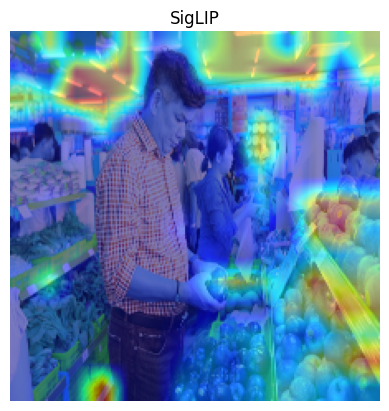

In [13]:
labels = ["Một người đàn ông đang cầm trên tay những quả táo", ""]


visiglip_ot_for_gradcam = ImageClassifier(viclip_ot=visiglip_ot, labels=labels).to(device).eval()
visiglip_ot_target_layers = visiglip_ot_for_gradcam.get_target_layers()

siglip_for_gradcam = ImageClassifier(viclip_ot=siglip, labels=labels).to(device).eval()
siglip_target_layers = siglip_for_gradcam.get_target_layers()

# image_file = '00000001126.jpg'
# image_file = '00000001127.jpg'
# image_file = '00000001177.jpg'
# image_file = '00000005007.jpg'
# image_file = '00000007430.jpg'
# image_file = '00000007493.jpg'
# image_file = '00000008321.jpg'
# image_file = '00000009163.jpg'
# image_file = '00000009173.jpg'
# image_file = '00000009175.jpg'
# image_file = '00000009321.jpg'
# image_file = '00000009382.jpg'
image_file = '00000009820.jpg'
# image_file = '00000009951.jpg'
# image_file = '00000010186.jpg'
# image_file = "00000010186.jpg"


image_file_path = os.path.join(DATASET_DIR, "images", image_file)

rgb_img = cv2.imread(image_file_path, 1)
assert rgb_img is not None
rgb_img = rgb_img[:, :, ::-1]
rgb_img = cv2.resize(rgb_img, (224, 224))
rgb_img = np.float32(rgb_img) / 255
input_tensor = preprocess_image(rgb_img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]).to(device)

targets = None

print(f"Query: {labels[0]}")

# Construct the CAM object once, and then re-use it on many images.
with GradCAM(
    model=visiglip_ot_for_gradcam,
    target_layers=visiglip_ot_target_layers,
    reshape_transform=reshape_transform,
) as cam:
    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets,
        eigen_smooth=eigen_smooth,
        aug_smooth=aug_smooth,
    )
    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]
    # You can also get the model outputs without having to redo inference
    model_outputs = cam.outputs

    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)

    # convert image appropriate color and display `cam_image`
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))
    plt.title("ViCLIP-OT")
    plt.axis("off")
    plt.show()

    cv2.imwrite(f"gradcam_{image_file}_{labels[0]}_viclip_ot.jpg", cam_image)

with GradCAM(
    model=siglip_for_gradcam,
    target_layers=siglip_target_layers,
    reshape_transform=reshape_transform,
) as cam:
    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=targets,
        eigen_smooth=eigen_smooth,
        aug_smooth=aug_smooth,
    )
    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]
    # You can also get the model outputs without having to redo inference
    model_outputs = cam.outputs

    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)

    # convert image appropriate color and display `cam_image`
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))
    plt.title("SigLIP")
    plt.axis("off")
    plt.show()

    cv2.imwrite(f"gradcam_{image_file}_{labels[0]}_siglip.jpg", cam_image)

In [20]:
@dataclass
class Sample:
    query: str
    query_en: str
    image_path: str
    model_A: str  # grad cam image path for model A
    model_B: str  # grad cam image path for model B


def visualize_grad_cam(
    samples: list[Sample],
    model_A_label: str,
    model_B_label: str,
    fig_width: float = 6.5,
    save_path: str | None = None,
):
    """Visualize Grad-CAM comparison between two models.

    Each row displays: query text (Vietnamese + English), original image,
    Grad-CAM for model A, and Grad-CAM for model B.
    Sized for elsarticle preprint single-column width (~6.5 in).

    Args:
        samples: List of Sample objects to visualize.
        fig_width: Figure width in inches (default 6.5 for elsarticle preprint).
        save_path: Path to save the figure (e.g., 'grad_cam_comparison.pdf').
    """

    plt.style.use(["science", "ieee", "no-latex"])
    # Override font: STIXGeneral (set by ieee style) lacks Vietnamese glyphs.
    # DejaVu Serif ships with matplotlib and has full Vietnamese coverage.
    plt.rcParams.update(
        {
            "font.serif": ["DejaVu Serif", "STIXGeneral"],
        }
    )

    num_samples = len(samples)
    assert num_samples > 0, "At least one sample is required"

    # Layout: 4 columns — query text | original | model A cam | model B cam
    width_ratios = [1.2, 1.0, 1.0, 1.0]
    num_cols = len(width_ratios)

    # Compute row height so images are roughly square
    total_ratio = sum(width_ratios)
    img_col_width = fig_width * (1.0 / total_ratio)
    row_height = img_col_width

    fig_height = row_height * num_samples

    fig = plt.figure(figsize=(fig_width, fig_height))
    gs = GridSpec(
        num_samples,
        num_cols,
        figure=fig,
        width_ratios=width_ratios,
        hspace=0.15,
        wspace=0.08,
    )

    col_headers = [
        "Query",
        "Original",
        model_A_label,
        model_B_label,
    ]

    for i, sample in enumerate(samples):
        # --- Query text (Vietnamese + English) ---
        ax_text = fig.add_subplot(gs[i, 0])
        ax_text.axis("off")
        wrapped_query = textwrap.fill(sample.query, width=32)
        wrapped_query_en = textwrap.fill(f"({sample.query_en})", width=32)
        ax_text.text(
            0.5,
            0.5,
            f"{wrapped_query}\n{wrapped_query_en}",
            ha="center",
            va="center",
            fontsize=6,
            fontstyle="italic",
            transform=ax_text.transAxes,
        )
        if i == 0:
            ax_text.set_title(col_headers[0], fontsize=6, pad=6)

        # --- Original image (resized to 224x224 to match Grad-CAM output) ---
        ax_orig = fig.add_subplot(gs[i, 1])
        orig_pil = (
            Image.open(sample.image_path)
            .convert("RGB")
            .resize((224, 224), Image.Resampling.BICUBIC)
        )
        ax_orig.imshow(np.asarray(orig_pil))
        ax_orig.axis("off")
        if i == 0:
            ax_orig.set_title(col_headers[1], fontsize=6, pad=6)

        # --- Grad-CAM model A ---
        ax_a = fig.add_subplot(gs[i, 2])
        cam_a_img = mpimg.imread(sample.model_A)
        ax_a.imshow(cam_a_img)
        ax_a.axis("off")
        if i == 0:
            ax_a.set_title(col_headers[2], fontsize=6, pad=6)

        # --- Grad-CAM model B ---
        ax_b = fig.add_subplot(gs[i, 3])
        cam_b_img = mpimg.imread(sample.model_B)
        ax_b.imshow(cam_b_img)
        ax_b.axis("off")
        if i == 0:
            ax_b.set_title(col_headers[3], fontsize=6, pad=6)

    if save_path is not None:
        plt.savefig(save_path, bbox_inches="tight", dpi=300, pad_inches=0.02)

    plt.show()

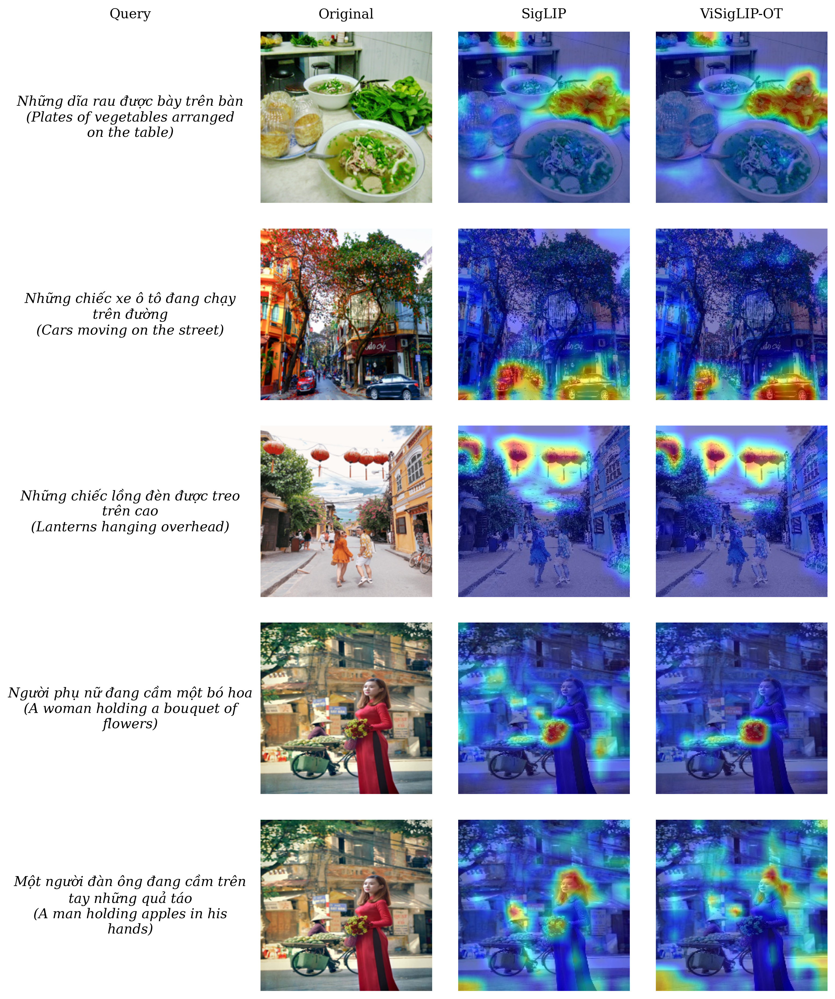

In [24]:
samples = [
    Sample(
        query="Những dĩa rau được bày trên bàn",
        query_en="Plates of vegetables arranged on the table",
        image_path="data/UIT-OpenViIC/images/00000009173.jpg",
        model_A="gradcam_00000009173.jpg_Những dĩa rau được bày trên bàn_siglip.jpg",
        model_B="gradcam_00000009173.jpg_Những dĩa rau được bày trên bàn_viclip_ot.jpg",
    ),
    Sample(
        query="Những chiếc xe ô tô đang chạy trên đường",
        query_en="Cars moving on the street",
        image_path="data/UIT-OpenViIC/images/00000009175.jpg",
        model_A="gradcam_00000009175.jpg_Những chiếc xe ô tô đang chạy trên đường_siglip.jpg",
        model_B="gradcam_00000009175.jpg_Những chiếc xe ô tô đang chạy trên đường_viclip_ot.jpg",
    ),
    Sample(
        query="Những chiếc lồng đèn được treo trên cao",
        query_en="Lanterns hanging overhead",
        image_path="data/UIT-OpenViIC/images/00000009382.jpg",
        model_A="gradcam_00000009382.jpg_Những chiếc lồng đèn được treo trên cao_siglip.jpg",
        model_B="gradcam_00000009382.jpg_Những chiếc lồng đèn được treo trên cao_viclip_ot.jpg",
    ),
    # Sample(
    #     query="Một cô gái mặc áo dài",
    #     query_en="A girl wearing an Ao dai",
    #     image_path="data/UIT-OpenViIC/images/00000008321.jpg",
    #     model_A="gradcam_00000008321.jpg_Một cô gái mặc áo dài_siglip.jpg",
    #     model_B="gradcam_00000008321.jpg_Một cô gái mặc áo dài_viclip_ot.jpg",
    # ),
    # Sample(
    #     query="Một người đàn ông đang cầm trên tay những quả táo",
    #     query_en="A man holding apples in his hands",
    #     image_path="data/UIT-OpenViIC/images/00000009820.jpg",
    #     model_A="gradcam_00000009820.jpg_Một người đàn ông đang cầm trên tay những quả táo_siglip.jpg",
    #     model_B="gradcam_00000009820.jpg_Một người đàn ông đang cầm trên tay những quả táo_viclip_ot.jpg",
    # ),
    Sample(
        query="Người phụ nữ đang cầm một bó hoa",
        query_en="A woman holding a bouquet of flowers",
        image_path="data/UIT-OpenViIC/images/00000010186.jpg",
        model_A="gradcam_00000010186.jpg_Người phụ nữ đang cầm một bó hoa_siglip.jpg",
        model_B="gradcam_00000010186.jpg_Người phụ nữ đang cầm một bó hoa_viclip_ot.jpg",
    ),
    Sample(
        query="Một người đàn ông đang cầm trên tay những quả táo",
        query_en="A man holding apples in his hands",
        image_path="data/UIT-OpenViIC/images/00000010186.jpg",
        model_A="gradcam_00000010186.jpg_Một người đàn ông đang cầm trên tay những quả táo_siglip.jpg",
        model_B="gradcam_00000010186.jpg_Một người đàn ông đang cầm trên tay những quả táo_viclip_ot.jpg",
    ),
    # Sample(
    #     query="Một người đàn ông đứng bên cạnh một chiếc xe ô tô",
    #     query_en="A man is standing next to a car",
    #     image_path="data/UIT-OpenViIC/images/00000009321.jpg",
    #     model_A="gradcam_00000009321.jpg_Một người đàn ông đứng bên cạnh một chiếc xe ô tô_siglip.jpg",
    #     model_B="gradcam_00000009321.jpg_Một người đàn ông đứng bên cạnh một chiếc xe ô tô_viclip_ot.jpg",
    # ),
]

visualize_grad_cam(
    samples,
    model_A_label="SigLIP",
    model_B_label="ViSigLIP-OT",
    save_path="grad_cam_comparison_siglip_versus_visiglip_ot_extra.pdf",
)